# Zadatak 1 (polutonirana slika)

Slika koju smo dobili (fajl sa nazivom 'girl_ht.tif'), pošto je polutonirana, imaće puno tačkica po sebi. Te tačkice, kao pravilne i ponavljajuće strukture će se videti u spektru slike kao **ponovljeni spektar**. Da bismo za ovu konkretnu sliku odradili restauraciju u originalnu sliku, moramo prvo da analiziramo njen spektar.

Napomena: Prilikom svih filtriranja, vršićemo **mirror padding**. Na taj način se neće videti efekat cirkularne konvolucije prilikom filtriranja.

## Analiza spektra

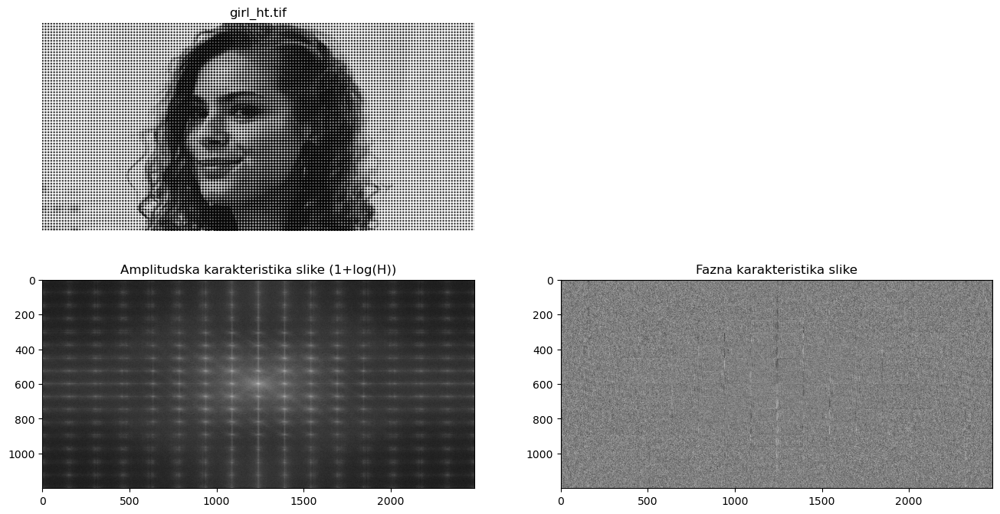

In [1]:
# importovanje bitnih biblioteka
from pylab import *
import skimage
from skimage import io
from skimage import exposure
from scipy import ndimage
import numpy as np

# Ucitavanje slike
img = skimage.img_as_float(imread('../sekvence/girl_ht.tif'));

# Prikaz slike i njene amplitudskih i fazne karakteristike 
img_fft = fftshift(fft2(img))
img_fft_mag = abs(img_fft)
img_fft_ang = np.angle(img_fft)

plt.figure(figsize=(16,8));
plt.subplot(2,2,1);
plt.imshow(img, cmap='gray');
plt.axis('off');
plt.title('girl_ht.tif');

plt.subplot(2,2,3);
plt.imshow(log(1+img_fft_mag), cmap='gray');
plt.title('Amplitudska karakteristika slike (1+log(H))');

plt.subplot(2,2,4);
plt.imshow(img_fft_ang, cmap='gray');
plt.title('Fazna karakteristika slike');

Prikazali smo početnu sliku, njen spektar (amplitudsku i faznu karakteristiku). Fazna karakteristika nam ne daje puno vizuelnih informacija kada je na prvi pogled vidimo. Najvažnija stvar u procesu restauracije naše slike je da ne želimo da menjamo ovu faznu karakteristiku. 

Kao što smo pretpostavili, spektar slike je periodičnog karaktera. Originalna slika, koja se nama traži u postavci zadatka, predstavlja jednu, **centralnu kopiju ovog spektra**. 
Moja inicijalna ideja je bila da iskoristimo samo jedan lowpass filtar, da filtriramo samo tu centralnu komponentu. Na ovaj način se može postići okej rezultat, ali se dobija znatno mutnija slika od originalne (zato što su ostale samo spektralne komponente oko DC komponente i obrisali smo trajno informacije da je izoštrimo).

Tehnika kojom ćemo restaurirati originalnu sliku iz polutonirane je **primenom noč filtra**. Pomoću njega ćemo da potisnemo sve kopije spektra, a ostaviti samo centralnu. Ova metoda se pokazala, a videćemo i kasnije, da će restaurirana slika da bude manje mutna od samo propuštanja kroz lowpass filtar.

## Samo lowpass filtriranje

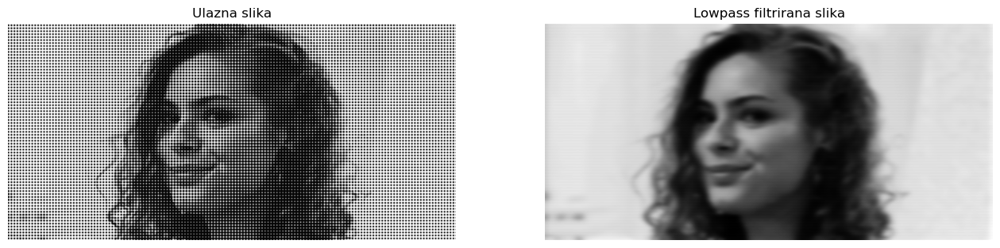

In [2]:
def lpfilter(filt_type, Ny, Nx, sigma, n=1):
    '''
    Kreira lowpass filtar zadatih dimenzija i tipa.
    
    Ulazi:
    - filt_type (string): vrsta filtra koju želimo. Može biti: gaussian, btw (Batervortov), ideal
    - Ny, Nx (int): dimenzije željenog filtra
    - sigma, n (float, int): parametri u zavisnosti od tipa filtra
    
    Izlazi:
    - filter_mask (numpy.ndarray): željeni lowpass filtar
    '''
    
    if (Ny%2 == 0):
        y = np.arange(0,Ny) - Ny/2 + 0.5
    else:
        y = np.arange(0,Ny) - (Ny-1)/2
    
    if (Nx%2 == 0):
        x = np.arange(0,Nx) - Nx/2 + 0.5
    else:
        x = np.arange(0,Nx) - (Nx-1)/2

    
    X, Y = meshgrid(x, y)
    
    D = np.sqrt(np.square(X) + np.square(Y))
    
    if filt_type == 'gaussian':
        filter_mask = exp(-np.square(D)/(2*np.square(sigma)))
    elif filt_type == 'btw':
        filter_mask = 1/(1+(D/sigma)**(2*n))
    elif filt_type == 'ideal':
        filter_mask = ones([Ny, Nx])
        filter_mask[D>sigma] = 0
    else:
        print('Greška! Nije podržan tip filtra: ', filt_type)
        return
    
    return filter_mask

# Dimenzije slike
[Ny, Nx] = shape(img)
Px = 2*Nx-1; Py = 2*Ny-1

# Padding: Mirroring 
img_pad = zeros([Py, Px])
img_pad[0:Ny, 0:Nx] = img
img_pad[Ny-1:Py, 0:Nx]= img[::-1,:]
img_pad[0:Ny, Nx-1:Px]= img[:,::-1]
img_pad[Ny-1:Py, Nx-1:Px]= img[::-1,::-1]

# Kreiranje lowpass filtra da potisne sve kopije spektra
lp_filt_freq = lpfilter('gaussian', Py, Px, 50) # 50 - širina filtra

# Filtriranje
img_pad_fft = fftshift(fft2(img_pad))
img_pad_fft_filt = img_pad_fft*lp_filt_freq
img_filt_pad = real(ifft2(ifftshift(img_pad_fft_filt)))
img_filt = np.clip(img_filt_pad[0:Ny, 0:Nx], 0, 1)

plt.figure(figsize=(16,8));
plt.subplot(1,2,1);
plt.imshow(img, cmap='gray');
plt.axis('off');
plt.title('Ulazna slika');
plt.subplot(1,2,2);
plt.imshow(img_filt, cmap='gray');
plt.axis('off');
plt.title('Lowpass filtrirana slika');

U gornjoj ćeliji smo kreirali lowpass gausov filtar, sa poluprečnikom spektra dovoljno malim da filtrira samo centralnu komponentu spektra.

Kao što vidimo, uspeli smo da otklonimo efekat tačkica. Međutim, što je i bilo očekivano, slika je izuzetno mutna. To je zato što smo otklonili visoke frekvencije i ne možemo da ih vratimo, znači ne možemo da izoštrimo ovu sliku. Kada bismo probali izoštravanje nad ovom desnom slikom, dobili bismo ponovo tačkice.

Zato moramo nekom drugom metodom da restauriramo sliku, a najbolja metoda za ovaj slučaj je noč filtar.

## Noč filtar

Strategija pomoću koje ćemo restaurirati sliku je u dva koraka:
1. Prvo ćemo lowpass filtrirati sliku sa nekom većom širinom filtra neko u preth. primeru
2. Zatim ćemo na tako filtriranu sliku primeniti noč filtar

Razlog zašto prvo filtriramo lowpass filtrom je da otklonimo što više daljih kopija spektra i da nam ostane manji broj kopija koje treba da potisnemo. Na taj način ćemo moći da sa manje računarske snage kreiramo noč filtar. Kada bismo pravili noč filtar za sve kopije spektra, vreme potrebno da se takav filtar napravi bi premašio 3 minuta. 

Komentar: Kako smo odredili **pozicije reject komponenti**?
Rekli smo da pri filtriranju koristimo mirror padding. Ukupna dimenzija proširene slike je 2399 x 4959. Prebrojavanjem uočavamo da se komponenta spektra kopira 16 x 16 puta, po obe ose. Dakle, centralni piksel ima indekse (1200, 2490), a širina jedne kopije spektra je 150 x 310 piksela.

Komentar: **Širinu reject komponenti** biramo da budu što šire, da potisnu što više energije kopija spektra, ali ne previše široke, da se ne bi na granicama kopija desio overflow i da tu ipak ne filtrira. Takođe, za vrstu reject filtra sam odabrao **batervortov**, jer je pokazao najbolje rezultate u poređenju sa gausovim i idealnim filtrom.

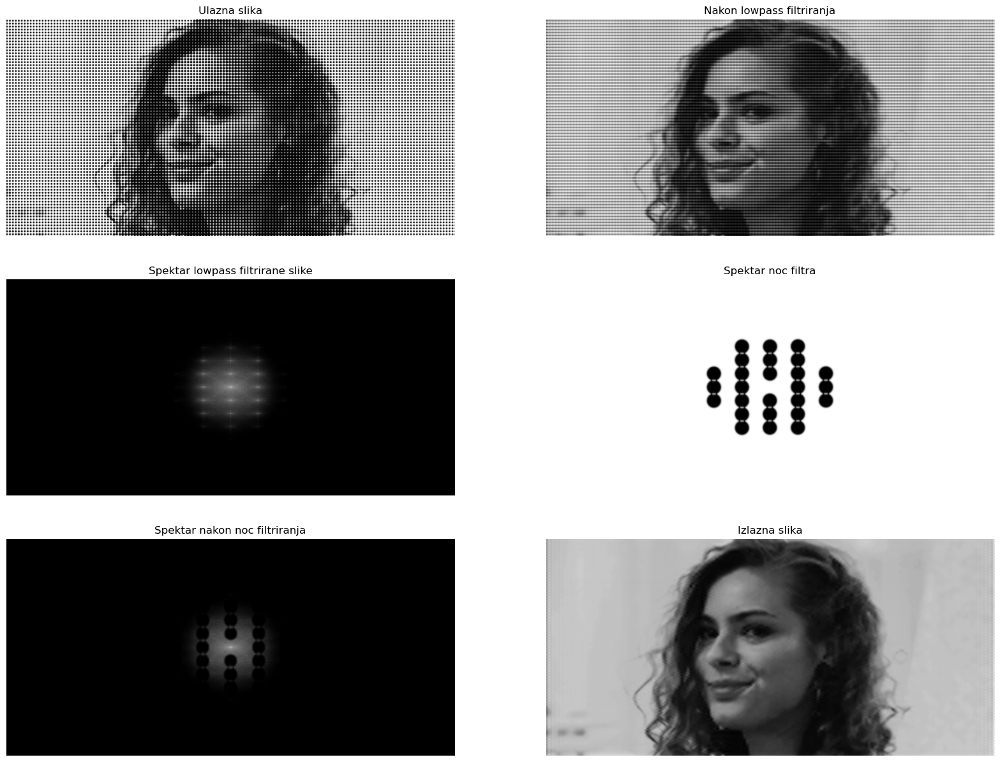

In [3]:
def cnotch(filt_type, notch, Ny, Nx, C, r, n=1):
    '''
    Kreira noc filtar sa zadatim reject komponentama i specificiranog tipa
    
    Ulazi:
    - filt_type (string): vrsta filtra koju želimo. Može biti: gaussian, btw (Batervortov), ideal
    - notch (string): da li želimo reject ili pass notch filtar
    - Ny, Nx (int): dimenzije željenog filtra
    - sigma, n (float, int): parametri u zavisnosti od tipa filtra
    
    Izlazi:
    - filter_mask (numpy.ndarray): željeni notch filtar
    '''
    N_filters = len(C)
    
    filter_mask = zeros([Ny,Nx])
    
    if (Ny%2 == 0):
        y = np.arange(0,Ny) - Ny/2 + 0.5
    else:
        y = np.arange(0,Ny) - (Ny-1)/2
    
    if (Nx%2 == 0):
        x = np.arange(0,Nx) - Nx/2 + 0.5
    else:
        x = np.arange(0,Nx) - (Nx-1)/2

    X, Y = meshgrid(x, y)
    
    for i in range(0, N_filters):
        C_current = C[i]
        
        C_complement = zeros([2,1])
        C_complement[0] = -C_current[0]
        C_complement[1] = -C_current[1]
        
        if (Ny%2 == 0):
            y0 = y - C_current[0] + Ny/2 - 0.5
        else:
            y0 = y - C_current[0] + (Ny-1)/2
        
        if (Nx%2 == 0):
            x0 = x - C_current[1] + Nx/2 - 0.5
        else:
            x0 = x - C_current[1] + (Nx-1)/2
        
        X0, Y0 = meshgrid(x0, y0)
        
        D0 = np.sqrt(np.square(X0) + np.square(Y0))
    
        if (Ny%2 == 0):
            y0c = y - C_complement[0] - Ny/2 + 0.5
        else:
            y0c = y - C_complement[0] - (Ny-1)/2
        
        if (Nx%2 == 0):
            x0c = x - C_complement[1] - Nx/2 + 0.5
        else:
            x0c = x - C_complement[1] - (Nx-1)/2
        
        X0c, Y0c = meshgrid(x0c, y0c)
        
        D0c = np.sqrt(np.square(X0c) + np.square(Y0c))
    
        if filt_type == 'gaussian':
            filter_mask = filter_mask + exp(-np.square(D0)/(2*np.square(r))) + exp(-np.square(D0c)/(2*np.square(r)))
        elif filt_type == 'btw':
            filter_mask = filter_mask + 1/(1+(D0/r)**(2*n)) + 1/(1+(D0c/r)**(2*n))
        elif filt_type == 'ideal':
            filter_mask[(D0<=r)|(D0c<=r)] = 1
        else:
            print('Greška! Nije podržan tip filtra: ', filt_type)
            return
    
    if notch == 'pass':
        return filter_mask
    elif notch == 'reject':
        return 1 - filter_mask
    else:
        return

# Komponente reject notch filtra
C = [[1050, 2480], [900, 2480], [750, 2480],  
     
    [1200, 2170], [1050, 2170], [900, 2170], [750, 2170],
    [1350, 2170], [1500, 2170], [1650, 2170], 
     
    [1200, 1860], [1050, 1860], 
    [1350, 1860]
    ]

# Mirror padding
img_pad = zeros([Py, Px])
img_pad[0:Ny, 0:Nx] = img
img_pad[Ny-1:Py, 0:Nx]= img[::-1,:]
img_pad[0:Ny, Nx-1:Px]= img[:,::-1]
img_pad[Ny-1:Py, Nx-1:Px]= img[::-1,::-1]

# Kreiranje filtara
notch_reject_filter = cnotch('btw', 'reject', Py, Px, C, 80, 10) # Ova naredba treba malo vremena da se izvrsi
lp_filt_freq = lpfilter('gaussian', Py, Px, 150)

# Filtriranje
img_pad_fft = fftshift(fft2(img_pad))
img_lowpass_pad_fft = img_pad_fft * lp_filt_freq
img_notch_filt_pad_fft = img_lowpass_pad_fft * notch_reject_filter

# Izdvajanje img_lowpass iz paddovane slike
img_lowpass_pad = real(ifft2(ifftshift(img_lowpass_pad_fft)))
img_lowpass = np.clip(img_lowpass_pad[0:Ny, 0:Nx], 0, 1)

# Izdvajanje img_notch_filt iz paddovane slike
img_notch_filt_pad = real(ifft2(ifftshift(img_notch_filt_pad_fft)))
img_notch_filt = np.clip(img_notch_filt_pad[0:Ny, 0:Nx], 0, 1)


# Prikazivanje rezultata filtriranja
plt.figure(figsize=(20,15));
plt.subplot(3,2,1);
plt.imshow(img, cmap='gray');
plt.title('Ulazna slika');
plt.axis('off')

plt.subplot(3,2,2);
plt.imshow(img_lowpass, cmap='gray');
plt.title('Nakon lowpass filtriranja');
plt.axis('off');

plt.subplot(3,2,3);
plt.imshow(log(1+abs(img_lowpass_pad_fft)), cmap='gray');
plt.title('Spektar lowpass filtrirane slike');
plt.axis('off');

plt.subplot(3,2,4);
plt.imshow(log(1+abs(notch_reject_filter)), cmap='gray');
plt.title('Spektar noc filtra');
plt.axis('off');

plt.subplot(3,2,5);
plt.imshow(log(1+abs(img_notch_filt_pad_fft)), cmap='gray');
plt.title('Spektar nakon noc filtriranja');
plt.axis('off');

plt.subplot(3,2,6);
plt.imshow(img_notch_filt, cmap='gray');
plt.title('Izlazna slika');
plt.axis('off');

Uspeli smo da filtriramo efekat tačkica iz slike. Konačna slika se može još malo poboljšati, popravkom kontrasta. Isprobavanjem sam uočio da naša filtrirana slika već zauzima ceo opseg intenziteta od minimalne do maksimalne vrednosti. Zbog toga, ne isplati nam se da vršio razvlačenje kontrasta. Umesto toga, izvršićemo **ekvalizaciju histograma**. U narednoj ćeliji je konačan rezultat restauracije.

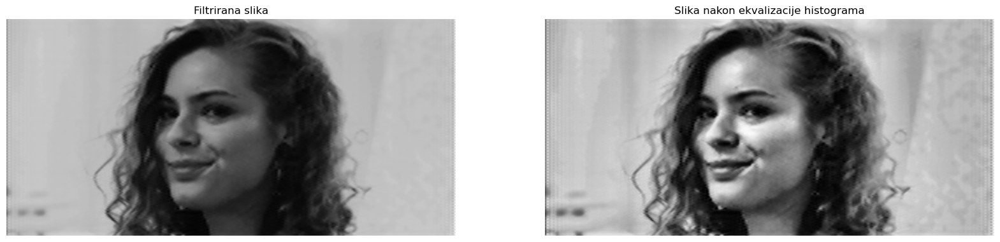

In [4]:
img_notch_filt_enhanced = exposure.equalize_adapthist(img_notch_filt)

plt.figure(figsize=(20,10));
plt.subplot(1,2,1);
plt.imshow(img_notch_filt, cmap='gray');
plt.title('Filtrirana slika');
plt.axis('off');

plt.subplot(1,2,2);
plt.imshow(img_notch_filt_enhanced, cmap='gray');
plt.title('Slika nakon ekvalizacije histograma');
plt.axis('off');

# Zadatak 2 (Uklanjanje šuma)

Potrebno je da potisnemo gausov šum iz ulazne slike. Uradićemo to na 2 načina:
- pomoću adaptivnog filtriranja
- pomoću bilateralnog filtra

## Adaptivno filtriranje

Ova metoda zahteva poznavanje varijansu gausovog šuma. Moramo je proceniti direktno iz ulazne slike. Ovo možemo da postignemo tako što posmatramo jedan uniforman region slike (npr. gornji levi ćošak slike) i da na osnovu intenziteta u tom regionu procenimo varijansu.

mean: 0.6275167921840017
var: 0.007892473083743695


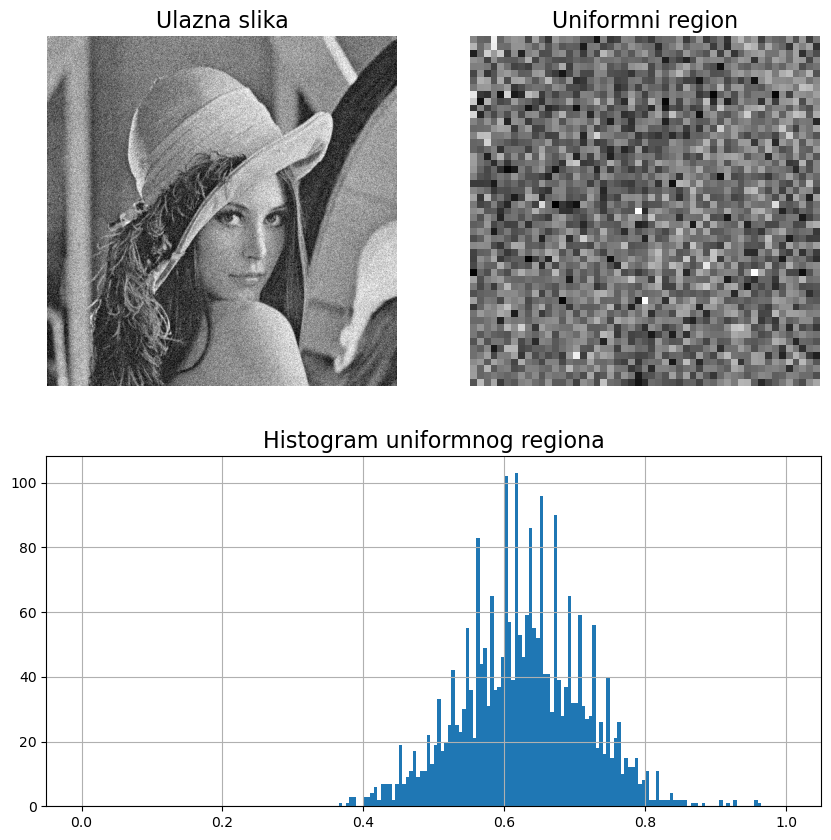

In [5]:
# importovanje bitnih biblioteka
from pylab import *
import skimage
from skimage import io
from skimage import util
from scipy import ndimage
import numpy as np
import cv2

# Ucitavanje slike
img = skimage.img_as_float(imread('../sekvence/lena_noise.tif'))
plt.figure(figsize=(10,10))
plt.subplot(2,2,1);
plt.imshow(img, cmap='gray')
plt.axis('off')
plt.title('Ulazna slika', fontsize=16)

# Procena varijanse suma
[N, M] = img.shape
img_uniform_region = img[0:round(N/10), 0:round(M/10)]

plt.subplot(2,2,2);
plt.imshow(img_uniform_region, cmap='gray');
plt.axis('off');
plt.title('Uniformni region', fontsize=16)

plt.subplot(2,1,2);
plt.title('Histogram uniformnog regiona', fontsize=16)
plt.grid('on')
x, y, _ = plt.hist(img_uniform_region.flatten(), bins=200, range=(0,1));
n, bins = np.histogram(img_uniform_region)
mids = 0.5*(bins[1:] + bins[:-1])

# Prikaz srednje vrednosti i varijanske u regionu
mean = np.average(mids, weights=n)
var = np.average((mids - mean)**2, weights=n)
print(f'mean: {mean}')
print(f'var: {var}')

Nakon što smo procenili da je varijansa šuma u slici otprilike $var=0.0079$, možemo da izvršimo adaptivno filtriranje.

**Odabir parametara**

Odabirom velike maske za filtriranje više potiskujemo šum. Međutim, adaptivno filtriranje u najužoj okolini oko ivica ne otklanja šum, tako da odabirom velike maske mi ne potiskujemo šum u sve većoj okolini oko ivica. Dakle, biramo veličinu maske da bude što veća ali da se u okolini ivica potisne što više šuma. Testiranjem sa vrednostima 7, 9, 11, 13, itd. utvrdio sam da je najbolji rezultat kada se izabere širina maske $n=9$

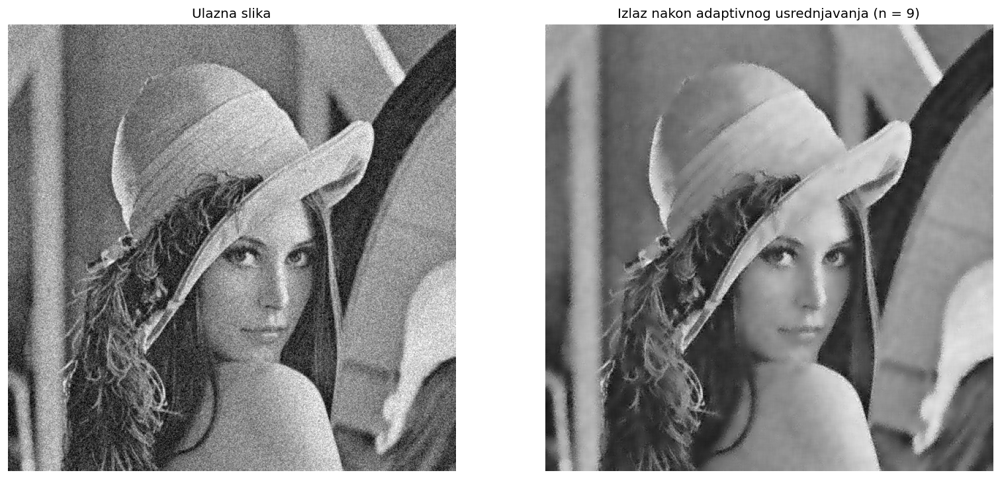

In [6]:
# ADAPTIVNO FILTRIRANJE

# Izbor parametara
n_adaptivno=9
noise_var = var
img_noise = img

# Odredjivanje lokalnih mat. ocekivanja
filt_avg = ones([n_adaptivno,n_adaptivno])/(n_adaptivno**2)
img_local_avg = ndimage.correlate(img_noise, filt_avg)
img_sqr_local_avg = ndimage.correlate(img_noise**2, filt_avg)
img_local_var = img_sqr_local_avg - img_local_avg**2

# Odredjivanje tezina w
weight = noise_var/img_local_var
weight[weight>1]=1

# Filtriranje
img_est = img_noise + weight*(img_local_avg-img_noise)

# Prikaz rezultata filtriranja
fig, axes = plt.subplots(nrows=1, ncols=2, figsize=(16,8), dpi=120)
ax = axes.ravel()

ax[0].imshow(img_noise, cmap='gray'); ax[0].set_axis_off(); ax[0].set_title('Ulazna slika');
ax[1].imshow(img_est, cmap='gray'); ax[1].set_axis_off(); ax[1].set_title(f'Izlaz nakon adaptivnog usrednjavanja (n = {n_adaptivno})');

## Bilateralni filtar

Bilateralni filtar funkcioniše slično kao gausov filtar. S tim što on ima dodatan činilac, 'range' komponentu. Usrednjava se ne samo po prostoru, već i u zavisnosti od intenziteta piksela, tj. ako su u sličnom opsegu. 

Koristićemo ugrađenu funkciju bilateralnog filtra iz cv2 biblioteke. Ona prima kao parametre 2 standardne devijacije, po prostoru i po intenzitetu, kao i širinu filtra i ulaznu sliku.

**Odabir parametar**

$n$ - širina maske: Biramo je da bude što veća, ali tako da maska ne bude mogla da preklapa više predmeta u slici (npr da se kosa, lice, pozadina ne nađu u istoj masci)

$\sigma_r$ - st. devijacija intenziteta piksela: Biranjem veće vrednosti ovog parametra će pikseli iz većeg opsega intenziteta se usrednjavati. Želimo da uzmemo malu vrednost za ovaj parametar.

$\sigma_s$ - st. devijacija udaljenosti piksela: Biranjem veće vrednosti ovog parametra će udaljeniji pikseli dobiti veće težine pri usrednjavanju. Ovaj parametar želimo da biramo tako da udaljeniji pikseli dobiju malu vrednost, a to će zavisiti od širine maske $n$ 

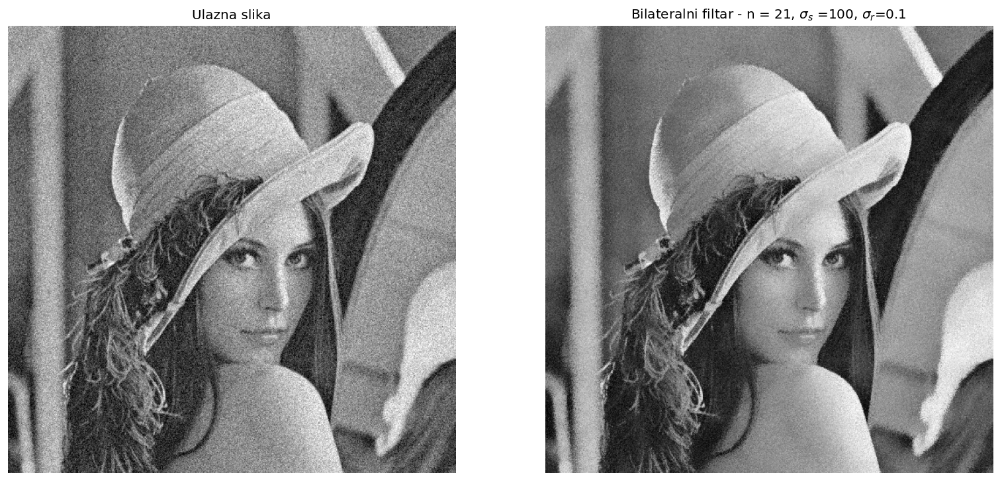

In [7]:
# BILATERALNI FILTAR

# Odabir parametara
n_bilateralno = 21
sigma_s = 100
sigma_r = 0.1

# Filtriranje
img_bilateral = cv2.bilateralFilter(util.img_as_float32(img), n_bilateralno, sigma_r, sigma_s)

# Prikaz rezultata filtriranja
fig, axes = plt.subplots(nrows=1, ncols=2, figsize=(16,8), dpi=120)
ax = axes.ravel()
ax[0].imshow(img, cmap='gray'); 
ax[0].set_axis_off(); 
ax[0].set_title('Ulazna slika')

ax[1].imshow(img_bilateral, cmap='gray'); 
ax[1].set_axis_off(); 
ax[1].set_title(f'Bilateralni filtar - n = {n_bilateralno}, $\sigma_s$ ={sigma_s}, $\sigma_r$={sigma_r}');

## Poređenje adaptivnog i bilateralnog filtriranja

Primenom bilateralnog filtra se dobija oštrija slika, sa više potisnutim šumom u okolini ivica. U odnosu na adaptivno filtriranje, daje bolje rezultate. Jedina mana bilateralnog filtra nad adaptivnim jeste njegova nelinearnost.

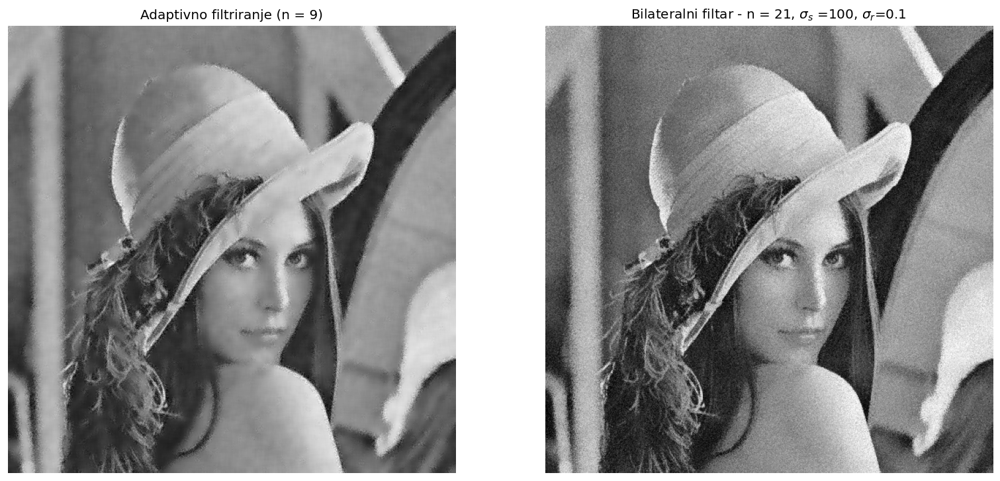

In [8]:
# Poredjenje adaptivnog i bilateralnog filtra
fig, axes = plt.subplots(nrows=1, ncols=2, figsize=(16,8), dpi=120)
ax = axes.ravel()
ax[0].imshow(img_est, cmap='gray'); 
ax[0].set_axis_off(); 
ax[0].set_title(f'Adaptivno filtriranje (n = {n_adaptivno})')

ax[1].imshow(img_bilateral, cmap='gray'); 
ax[1].set_axis_off(); 
ax[1].set_title(f'Bilateralni filtar - n = {n_bilateralno}, $\sigma_s$ ={sigma_s}, $\sigma_r$={sigma_r}');

# Zadatak 3 (Uklanjanje degradacije)

Dobili smo ulaznu sliku koja je degradirana usled kretanja kamere i dato nam je koje kretanje kamere je izazvalo degradaciju. Pre restauracije, pokažimo ideju postupka.

## Otklanjanje degradacija

Ceo **proces degradacije** možemo da modeliramo sledećim izrazom:

$ g(x,y)=f(x,y)*h(x,y)+\eta (x,y)$,

gde su:<br>
$f(x,y)$ - originalna, nedegradirana slika <br>
$h(x,y)$ - impulsni odziv degradacione funkcije<br>
$\eta (x,y)$ - aditivni šum<br>
$g(x,y)$ - degradirana slika

Pretpostaviću da u ulaznoj slici postoji **mali aditivni šum**. Zbog centralne granične teoreme, aproksimiraćemo taj šum kao **gausom šum**. Pošto smo ga na taj način modelovali, najlakši način da se gausov šum potisne iz slike je pomoću lowpass filtra. 
Prikažimo sada našu ulaznu sliku i njen spektar.

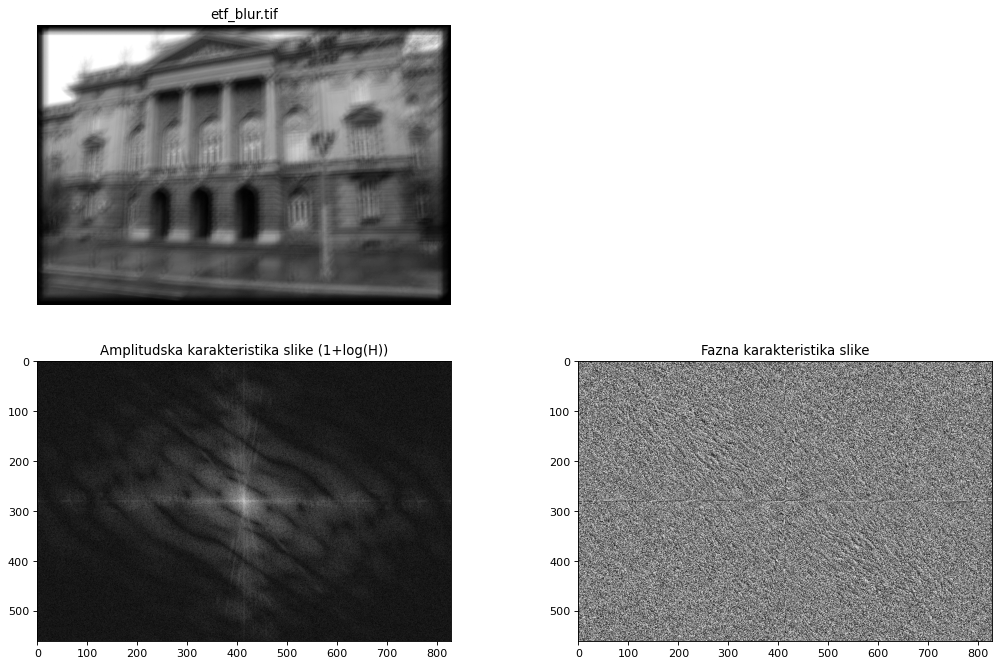

In [9]:
# importovanje bitnih biblioteka
from pylab import *
import skimage
from skimage import io
from skimage import util
from scipy import ndimage
import numpy as np
import cv2

# Prikazivanje spektra slike
img = skimage.img_as_float(imread('../sekvence/etf_blur.tif'));

img_fft = fftshift(fft2(img))
img_fft_mag = abs(img_fft)
img_fft_ang = np.angle(img_fft)

fig, axes = plt.subplots(nrows=2, ncols=2, figsize=(16,10), dpi=80)
ax = axes.ravel()

ax[0].imshow(img, cmap='gray')
ax[0].axis('off')
ax[0].set_title('etf_blur.tif');

fig.delaxes(ax[1])

ax[2].imshow(log(1+img_fft_mag), cmap='gray');
ax[2].set_title('Amplitudska karakteristika slike (1+log(H))');

ax[3].imshow(img_fft_ang, cmap='gray');
ax[3].set_title('Fazna karakteristika slike');

Komentar: Uočavamo da naša ulazna slika ima crne okvire. Pošto znamo da je naša slika dobijena konvolucijom sa kernelom, ovaj crni okvir je verovatno posledica ciklične konvolucije. 

Prikažimo sada **naš kernel**. Pošto je on manjih dimenzija od originalne slike, proširićemo ga do dimenzija slike, tj. njenog fft-a i onda ćemo takav kernel prebaciti u frekvencijski domen. Uočimo da prilikom degradacije naše originalne slike (konvolucije sa kernelom) se **menja njena faza**. Da bismo u potpunosti restaurirali originalnu sliku, moramo da zamenjenoj slici promenimo fazu. Samo u ovom slučaju odstupamo od pravila da prilikom filtriranja slike u frekvencijskom domenu ne diramo njenu fazu.

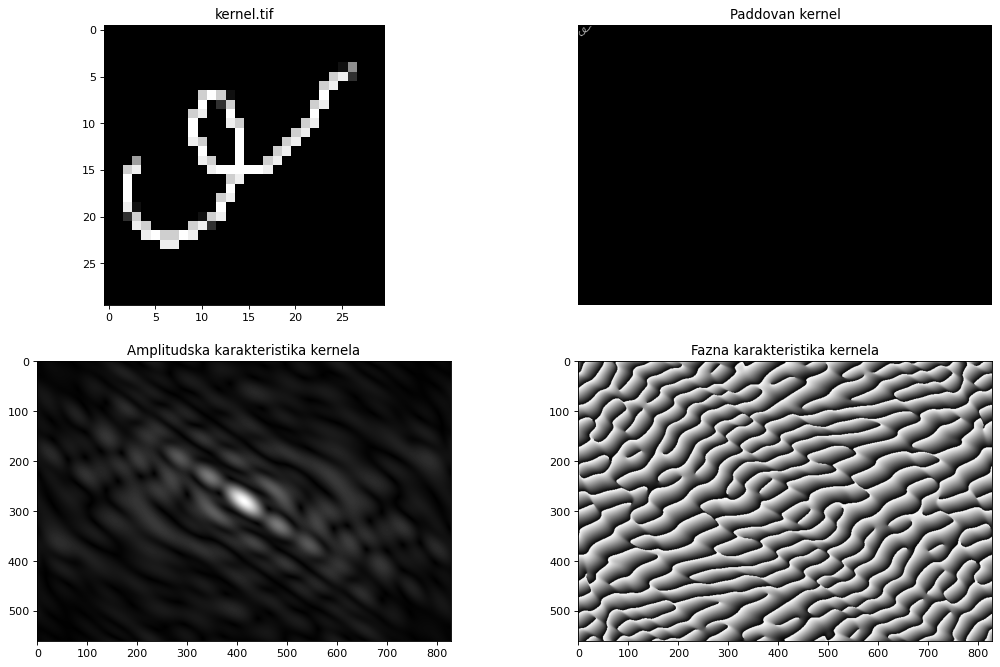

In [10]:
# Prikazivanje spektra kernela

kernel = util.img_as_float(imread('../sekvence/kernel.tif'));
# kernel = kernel/np.sum(kernel)
kernel_resized = zeros(img.shape)
kernel_resized[0:kernel.shape[0], 0:kernel.shape[1]]= kernel

kernel_fft = fftshift(fft2(kernel_resized))
H_motion = kernel_fft

kernel_fft_mag = abs(kernel_fft)
kernel_fft_ang = np.angle(kernel_fft)

fig, axes = plt.subplots(nrows=2, ncols=2, figsize=(16,10), dpi=80)
ax = axes.ravel()
ax[0].imshow(kernel, cmap='gray')
ax[0].set_title('kernel.tif')

ax[1].imshow(kernel_resized, cmap='gray')
ax[1].axis('off')
ax[1].set_title('Paddovan kernel');

ax[2].imshow(kernel_fft_mag, cmap='gray');
ax[2].set_title('Amplitudska karakteristika kernela');

ax[3].imshow(kernel_fft_ang, cmap='gray');
ax[3].set_title('Fazna karakteristika kernela');

Restauraciju slike ćemo isprobati na dva načina:
- Inverznim filtriranjem
- Vinerovim filtrom

## Inverzno filtriranje


Ova metoda se zasniva na izrazu koji smo gore pokazali. Ekvivalent tom izrazu u frekvencijskom domenu je:

$G = F \cdot H + N$,

gde su G, F, H i N redom furijeove transformacije od $g(x,y)$, $f(x,y)$, $h(x,y)$ i $\eta(x,y)$


Iz ovoga, možemo proceniti originalnu sliku kao:

$\hat{F} = \frac{G}{H} = F + \frac{N}{H}$

Međutim, pri deljenju sa degradacionom funkcijom, ako ona ima male vrednosti, to će **pojačati šum**. Pošto smo pretpostavili da naša ulazna slika ima malo šuma, pre nego što izvršimo inverzno filtriranje, moramo da ulaznu sliku filtriramo **lowpass filtrom**. Nakon toga ćemo inverznim filtriranjem dobiti restauriranu sliku sa manje izraženim šumom.

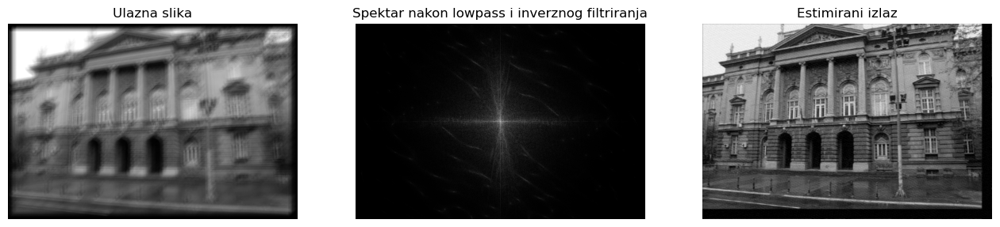

In [11]:
# INVERZNO FILTRIRANJE

def lpfilter(filt_type, Ny, Nx, sigma, n=1):
    '''
    Kreira lowpass filtar zadatih dimenzija i tipa.
    
    Ulazi:
    - filt_type (string): vrsta filtra koju želimo. Može biti: gaussian, btw (Batervortov), ideal
    - Ny, Nx (int): dimenzije željenog filtra
    - sigma, n (float, int): parametri u zavisnosti od tipa filtra
    
    Izlazi:
    - filter_mask (numpy.ndarray): željeni lowpass filtar
    '''
    
    if (Ny%2 == 0):
        y = np.arange(0,Ny) - Ny/2 + 0.5
    else:
        y = np.arange(0,Ny) - (Ny-1)/2
    
    if (Nx%2 == 0):
        x = np.arange(0,Nx) - Nx/2 + 0.5
    else:
        x = np.arange(0,Nx) - (Nx-1)/2

    
    X, Y = meshgrid(x, y)
    
    D = np.sqrt(np.square(X) + np.square(Y))
    
    if filt_type == 'gaussian':
        filter_mask = exp(-np.square(D)/(2*np.square(sigma)))
    elif filt_type == 'btw':
        filter_mask = 1/(1+(D/sigma)**(2*n))
    elif filt_type == 'ideal':
        filter_mask = ones([Ny, Nx])
        filter_mask[D>sigma] = 0
    else:
        print('Greška! Nije podržan tip filtra: ', filt_type)
        return
    
    return filter_mask

# Ucitavanje slike i kernela
img = skimage.img_as_float(imread('../sekvence/etf_blur.tif'));
kernel = util.img_as_float(imread('../sekvence/kernel.tif'));

# FFT slike i kernela
img_fft = fftshift(fft2(img))
kernel_resized = zeros(img.shape)
kernel_resized[0:kernel.shape[0], 0:kernel.shape[1]]= kernel
kernel_fft = fftshift(fft2(kernel_resized))
H_motion = kernel_fft

# Kreiranje lowpass filtra, za otklanjanje suma pre inverznog filtriranja
[Ny, Nx] = shape(img)
lp_filt_freq = lpfilter('gaussian', Ny, Nx, 130)

# lowpass filtriranje + inverzno filtriranje
img_fft_est_filt = (img_fft*lp_filt_freq)/H_motion
img_est_inverse = real(ifft2(ifftshift(img_fft_est_filt)))
img_est_inverse = np.clip(img_est_inverse, 0, 1)

# Prikaz rezultata
plt.figure(figsize=(16,10));
plt.subplot(1,3,1);
plt.imshow(img, cmap='gray');
plt.axis('off');
plt.title('Ulazna slika');

plt.subplot(1,3,2);
plt.imshow(log(1+abs(img_fft_est_filt)), cmap='gray');
plt.axis('off');
plt.title('Spektar nakon lowpass i inverznog filtriranja');

plt.subplot(1,3,3);
plt.imshow(img_est_inverse, cmap='gray');
plt.axis('off');
plt.title('Estimirani izlaz');

Dobili smo izlaznu sliku dobre jasnoće. Kao što smo komentarisali iznad, uočavaju se crni dodaci na donjoj i desnoj ivici slike. Oni su posledica ciklične konvolucije. Možemo da ove padding-e otklonimo i da dobijemo konačan rezultat primenom ove metode. Dimenzije potrebne za skidanje padding-a sam odokativno odredio da budu oko 530x800.

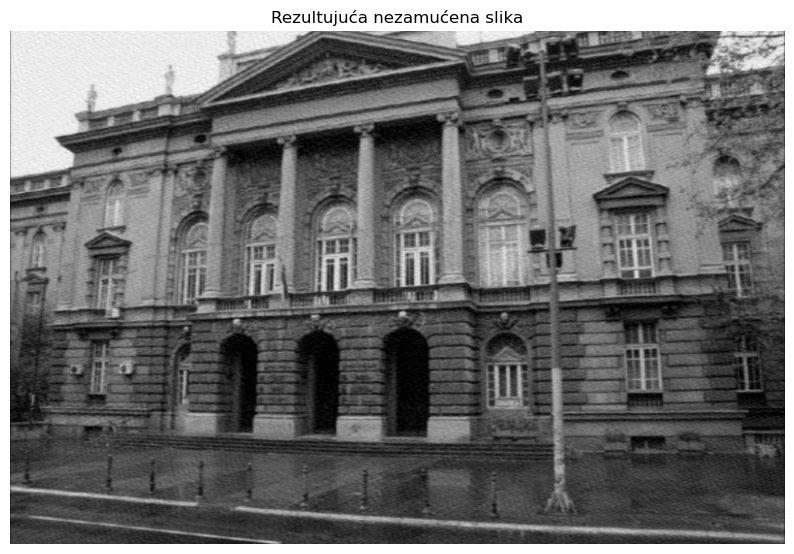

In [12]:
img_est_inverse_nopad = img_est_inverse[0:530, 0:800]
plt.figure(figsize=(10,10));
plt.imshow(img_est_inverse_nopad, cmap='gray');
plt.title('Rezultujuća nezamućena slika');
plt.axis('off');

## Vinerov filtar

Ova vrsta filtara predstavlja filtar koji minimizira srednju kvadradtnu grešku pri inverznom filtriranju u prisustvu šuma. Konačan izraz za ovaj filtar je sledeći:

$\hat{F} = \left( \frac{|H|^2}{|H|^2+\frac{S_n}{S_f}} \right) \cdot \frac{G}{H} $

Pošto su spektri snaga šuma i nedegradirane slike ($S_n$ i $S_f$) nama nepoznati, često se umesto njih u prethodnom izrazu uvodi parametar K:

$\hat{F} = \left( \frac{|H|^2}{|H|^2+K} \right) \cdot \frac{G}{H} $

Povećanjem vrednosti parametra K se slika više usrednjava, što otklanja šum, ali izlazna slika onda liči na početnu. Smanjenjem vrednosti parametra K slika postaje izoštrenija, ali i šum ostaje izraženiji (visoke učestanosti se manje filtriraju). Parametar smo odabrali tako da se potisnu visoke učestanosti, ali da izlazna slika ostane dovoljno izoštrena.

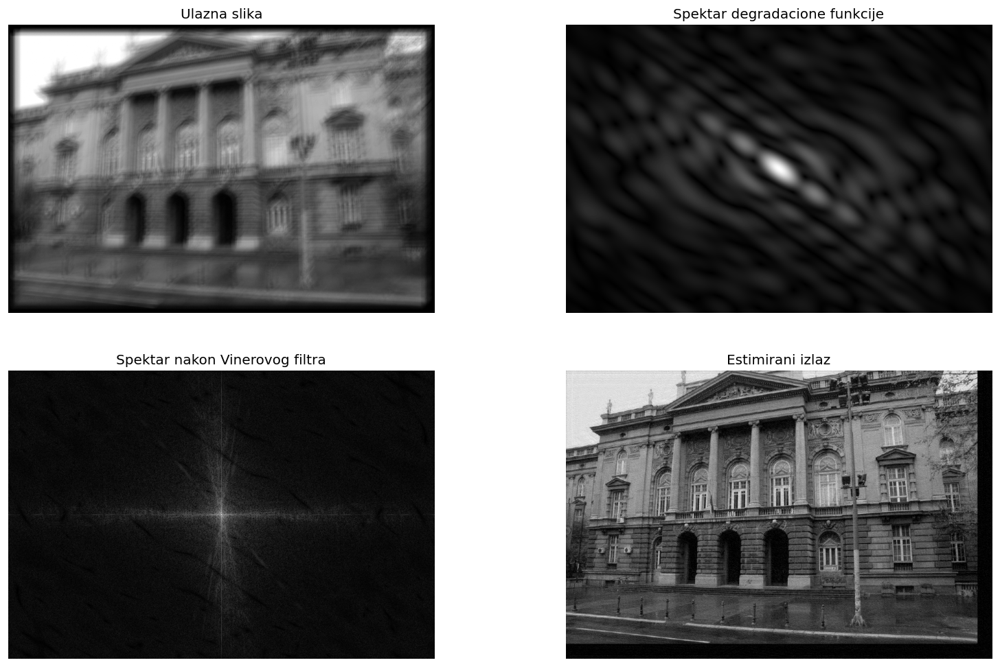

In [13]:
# VINEROV FILTAR

# Odabir parametra K
k = 5

# Izraz u zagradama W
W = (abs(H_motion)**2)/(abs(H_motion)**2 + k)

# Filtriranje
img_fft_est = (img_fft/H_motion)*W
img_est_wiener = real(ifft2(ifftshift(img_fft_est)))
img_est_wiener = np.clip(img_est_wiener, 0, 1)

# Prikaz rezultata
fig, axes = plt.subplots(nrows=2, ncols=2, figsize=(16,10), dpi=120)
ax = axes.ravel()

ax[0].imshow(img, cmap='gray'); ax[0].set_axis_off(); ax[0].set_title('Ulazna slika')
ax[1].imshow(abs(H_motion), cmap='gray'); ax[1].set_axis_off(); ax[1].set_title('Spektar degradacione funkcije')
ax[2].imshow(log(1+abs(img_fft_est)), cmap='gray'); ax[2].set_axis_off(); ax[2].set_title('Spektar nakon Vinerovog filtra')
ax[3].imshow(img_est_wiener, cmap='gray'); ax[3].set_axis_off(); ax[3].set_title('Estimirani izlaz');

Vinerov filtar je uspeo da izvršii dekonvoluciju, a da pri tome ne pojača šum. Čak, izlazna slika ima manje šuma nakon vinerovog filtra nego nakon inverznog filtriranja. Ovo ima smisla, jer je Vinerov filtar napravljen sa ovim zahtevom. 

Isto kao u prethodnoj metodi, inverznom filtriranju, izlazna slika ima zero-pad na donjoj i desnoj ivici. Kao i pre, crop-ovaćemo sliku, sa istim dimenzijama, a zatim uporediti je sa rezulzatom prethodne metode. 

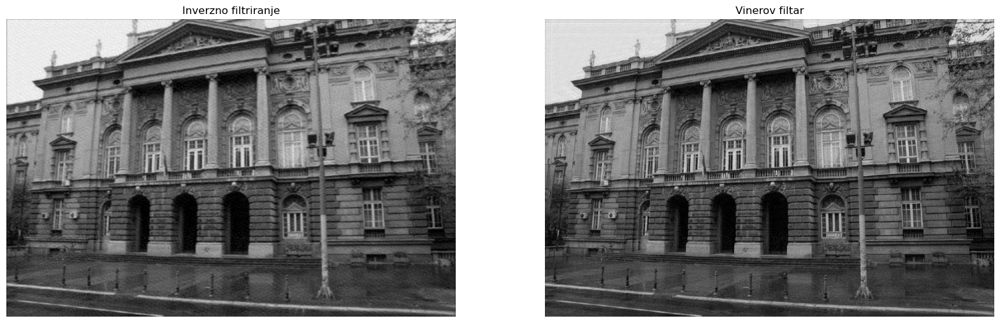

In [14]:
img_est_wiener_nopad = img_est_wiener[0:530, 0:800]
plt.figure(figsize=(20,10));
plt.subplot(1,2,1)
plt.imshow(img_est_inverse_nopad, cmap='gray');
plt.title('Inverzno filtriranje');
plt.axis('off');

plt.subplot(1,2,2)
plt.imshow(img_est_wiener_nopad, cmap='gray');
plt.title('Vinerov filtar');
plt.axis('off');

**Zaključak**: Primenom vinerovog filtra smo na bolji način restaurirali sliku. Bolje je filtriran šum i bolje je izoštrena slika.

# Zadatak 4 (Brzine filtriranja)

U ovom zadatku ćemo realizovati filtriranje gausovim filtrom u prostornom i frekvencijskom domenu. 

Funkciju za filtriranje u **prostornom domenu** realizujemo na sledeći način:
1. Kreiramo masku, dimenzija $2r+1$ x $2r +1$, takvu da je jedinična suma maske i da je gausovog tipa
2. Dodamo repeat-padding na ulaznu sliku
3. Za svaki piksel izracunamo konvoluciju i suma toga predstavlja novi piksel

Funkciju za filtriranje u **frekvencijskom domenu** realizujemo na sledeći način:
1. Dodamo repeat-padding na ulaznu sliku
2. Kreiramo masku, istu kao u preth. metodi
3. Proširujemo masku nulama tako da bude istih dimenzija kao paddovana slika
4. Nalazimo fft proširene slike i proširene maske, zatim ih množimo
5. inverzan fft i odbacivanje padding-a

Sledi realizacija ovih funkcija.

In [15]:
# Importovanje bitnih biblioteka
from pylab import *
import skimage
from skimage import io
from scipy import ndimage
import numpy as np

img = skimage.img_as_float(imread('../sekvence/lena_noise.tif'))

def filter_gauss(img, r, sigma):
    '''
    Vrši filtriranje gausovim filtrom u prostornom domenu.
    
    Ulazi:
    - img (numpy.ndarray): ulazna slika
    - r (int): poluprečnik gausovog filtra
    - sigma (float): standardna devijacija gausovog filtra
    
    Izlazi:
    - img_out (numpy.ndarray): filtrirana slika
    '''
    # Provera validnosti parametara
    if(r<1):
        print("Nevalidni parametri")
        return
    
    
    N, M = img.shape

    # Kreiranje maske
    x = np.arange(-r,r+1)
    y = np.arange(-r,r+1)
    X, Y = np.meshgrid(x,y)
    mask = np.exp(-(np.square(X)+np.square(Y))/(2*sigma**2))
    # mask = np.exp(np.divide(-(np.square(X)+np.square(Y)),2*sigma**2))
    sum = np.sum(mask)
    mask = np.divide(mask, sum) # Obezbedjujemo da se osvetljenost slike ne menja
    # mask = mask/sum

    # Repeat padding
    repeat_arr = ones(N, dtype=uint8)
    repeat_arr[0] = repeat_arr[0]+r
    repeat_arr[-1] = repeat_arr[-1]+r
    img_pad = np.repeat(img, repeats= repeat_arr, axis = 0)
    img_pad = np.repeat(img_pad, repeats= repeat_arr, axis = 1)
    
    # Korelacija sa maskom
    img_out = zeros((N,M))
    for x in range(0,N):
        for y in range(0,M):
            img_out[x,y] = np.sum(np.multiply(mask, img_pad[x:x+2*r+1, y:y+2*r+1]))
            
    return img_out
    
def filter_gauss_freq(img, r, sigma):
    '''
    Vrši filtriranje gausovim filtrom u frekvencijskom domenu.
    
    Ulazi:
    - img (numpy.ndarray): ulazna slika
    - r (int): poluprečnik gausovog filtra
    - sigma (float): standardna devijacija gausovog filtra
    
    Izlazi:
    - img_out (numpy.ndarray): filtrirana slika
    '''
    N, M = img.shape

    # Repeat padding
    repeat_arr = ones(N, dtype=uint8)
    repeat_arr[0] = repeat_arr[0]+r
    repeat_arr[-1] = repeat_arr[-1]+r
    img_pad = np.repeat(img, repeats= repeat_arr, axis = 0)
    img_pad = np.repeat(img_pad, repeats= repeat_arr, axis = 1)

    # FFT filtra
    x = np.arange(-r,r+1)
    y = np.arange(-r,r+1)
    X, Y = np.meshgrid(x,y)
    mask = np.exp(np.divide(-(np.square(X)+np.square(Y)), 2*sigma**2))
    sum = np.sum(mask)
    mask = np.divide(mask, sum) # Obezbedjujemo da se osvetljenost slike ne menja
    # mask = mask/sum
    mask_pad = zeros(img_pad.shape)
    mask_pad[0:2*r+1, 0:2*r+1]=mask
    
    # FFT slike i maske
    img_pad_fft = fftshift(fft2(img_pad))
    mask_freq = fftshift(fft2(mask_pad))

    # Filtriranje
    img_out_freq = np.multiply(img_pad_fft, abs(mask_freq))
    img_out_pad = real(ifft2(ifftshift(img_out_freq)))
    img_out = np.clip(img_out_pad[r:N+r,r:M+r], 0, 1)

    return img_out

## Poređenje rada funkcija

Želimo da pokažemo da naše napisane funkcije na isti način filtriraju sliku sa istim ulaznim parametrima. Takođe, želimo da pokažemo da naše funkcije ne menjaju osvetljenost ulazne slike. 

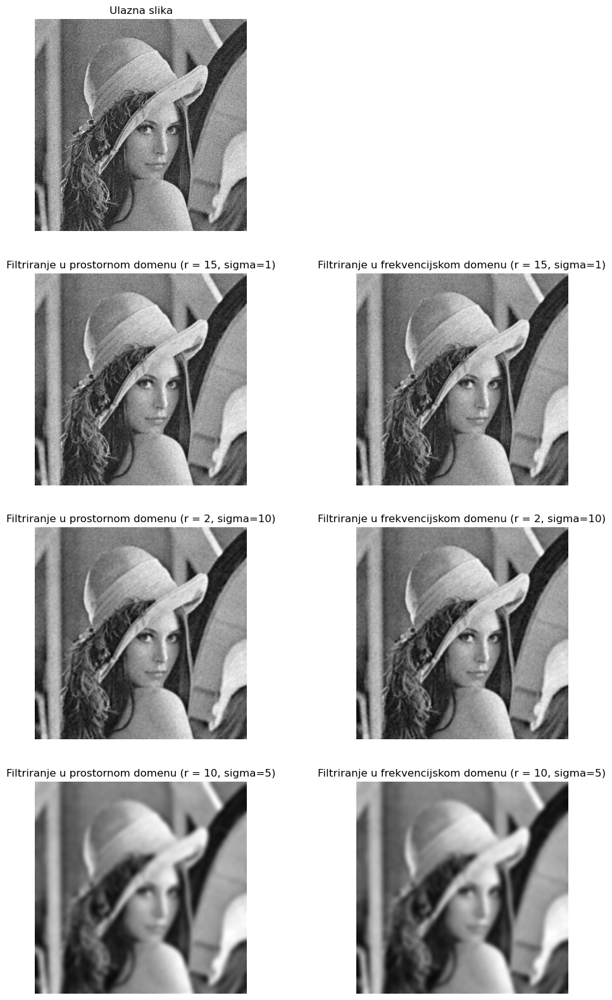

In [16]:
# Prikazivanje originalne slike
plt.figure(figsize=(12,20));
plt.subplot(4,2,1);
plt.imshow(img, cmap='gray');
plt.axis('off');
plt.title('Ulazna slika');

# 1. slucaj
r = 15
sigma = 1
img_filt_space = filter_gauss(img, r, sigma)
img_filt_freq = filter_gauss_freq(img, r, sigma)

plt.subplot(4,2,3);
plt.imshow(img_filt_space, cmap='gray');
plt.axis('off');
plt.title(f'Filtriranje u prostornom domenu (r = {r}, sigma={sigma})');
plt.subplot(4,2,4);
plt.imshow(img_filt_freq, cmap='gray');
plt.axis('off');
plt.title(f'Filtriranje u frekvencijskom domenu (r = {r}, sigma={sigma})');

# 2. slucaj
r = 2
sigma = 10

img_filt_space = filter_gauss(img, r, sigma)
img_filt_freq = filter_gauss_freq(img, r, sigma)

plt.subplot(4,2,5);
plt.imshow(img_filt_space, cmap='gray');
plt.axis('off');
plt.title(f'Filtriranje u prostornom domenu (r = {r}, sigma={sigma})');
plt.subplot(4,2,6);
plt.imshow(img_filt_freq, cmap='gray');
plt.axis('off');
plt.title(f'Filtriranje u frekvencijskom domenu (r = {r}, sigma={sigma})');

# 3. slucaj
r = 10
sigma = 5

img_filt_space = filter_gauss(img, r, sigma)
img_filt_freq = filter_gauss_freq(img, r, sigma)

plt.subplot(4,2,7);
plt.imshow(img_filt_space, cmap='gray');
plt.axis('off');
plt.title(f'Filtriranje u prostornom domenu (r = {r}, sigma={sigma})');
plt.subplot(4,2,8);
plt.imshow(img_filt_freq, cmap='gray');
plt.axis('off');
plt.title(f'Filtriranje u frekvencijskom domenu (r = {r}, sigma={sigma})');

In [17]:
print(f"mean img: {mean(img)} \nmean img_space: {mean(img_filt_space)} \nmean img_freq: {mean(img_filt_freq)}")

mean img: 0.4845785253188189 
mean img_space: 0.48457528953718965 
mean img_freq: 0.48457533662247726


**Napomena**: Iako filtriranje u frekvencijskom domenu menja osvetljenost za vrlo malu vrednost, to je posledica pri prelasku u frekvencijski domen. Pošto je greška manja od promil, možemo je zanemariti.

## Testiranje brzine


Sada ćemo testirati vreme izvršavanja ovih funkcija. Prikazaćemo kako se porede u zavisnosti od veličine maske filtra.

In [18]:
import time

N = 50

r_arr = np.arange(1,N+1)
sigma_arr = r_arr/3
space_domain = np.zeros(N)
freq_domain = np.zeros(N)

for i in range(N):
    if(i%10==0):
        print(f'Izvrsavaju se iteracije od {i+1}. do {i+10}.')
    r = r_arr[i]
    sigma = sigma_arr[i]
    start = time.time()
    imgout = filter_gauss(img, r, sigma)
    end = time.time()
    space_domain[i] = end-start
    start = time.time()
    imgout = filter_gauss_freq(img, r, sigma)
    end = time.time()
    freq_domain[i] = end-start

Izvrsavaju se iteracije od 1. do 10.
Izvrsavaju se iteracije od 11. do 20.
Izvrsavaju se iteracije od 21. do 30.
Izvrsavaju se iteracije od 31. do 40.
Izvrsavaju se iteracije od 41. do 50.


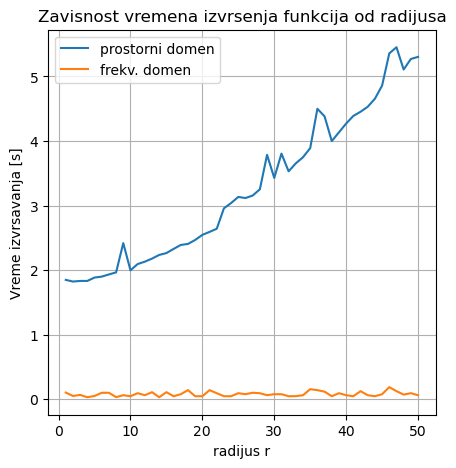

In [19]:
plt.figure(figsize=(5,5))
plt.title("Zavisnost vremena izvrsenja funkcija od radijusa")

plt.plot(r_arr, space_domain, label='prostorni domen')
plt.plot(r_arr, freq_domain, label='frekv. domen')

plt.grid(visible=True)
plt.legend()
plt.xlabel('radijus r')
plt.ylabel('Vreme izvrsavanja [s]')
plt.show()

**Zakljucak o brzini metoda**:

Na grafiku uočavamo outlier-e. Oni vrlo malo odstupaju od trenda krive za prostorni domen, pa možemo da smatramo da je narandžasta kriva (frekv. domen) približno konstantna, dok plava kriva (prostorni domen) ima trend ~$n^2$
    
Filtriranje u frekvencijskom domenu vremenski zavisi samo od brzine fft-a (koji je slozenosti $k\cdot log(k)$). Proces filtriranja zahteva samo jedno matricno element-wise mnozenje. Za razliku od frekvencijskog domena, u prostornom domenu se vrsi $n^2$ mnozenja matrica element-wise. Samim tim, ako imamo velike slike koje treba da se filtriraju, uvek bih predlozio u frekvencijskom domenu. Ukoliko imamo neku malu sliku (ali izuzetno malu), onda bi vremenski ove dve metode mogle da se uporede, pa bi vreme izvrsenja zavisilo samo od sirine filtra. 